# Latest Mark 6

In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from copy import deepcopy
import shapely.geometry as shapgeo

In [54]:
def read_files(ddir):
    images = dict()
    ACCEPTED_FORMAT = ['jpg', 'png']
    for d in sorted(os.listdir(ddir)):
        if d.split('.')[1].lower() in ACCEPTED_FORMAT:
            fname = d.split('.')[0]
            print(f'reading {os.path.join(ddir, d)}...')
            images[fname] = cv2.imread(os.path.join(ddir, d))
            images[fname] = cv2.cvtColor(images[fname], cv2.COLOR_BGR2RGB)
    return images

def display_all(imgs, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def display_all_with(imgs, cc, subs=(10,10), fgsz=(15,18), use_gray=True):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k][:,:,cc], cmap='gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def save_plots(imgs, suptitle, savedir, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
    fig.suptitle(suptitle)
    fig.savefig(savedir)
    print(f'Figure is successfully saved at {savedir}')

def adjust_gamma(image, gamma=1.0):
    table = np.array([((i / 255.0) ** gamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)

In [55]:
POSITIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive'
NEGATIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/negative'
IDEAL = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/drishtiGS_069.png'

## Read Images

In [56]:
pos = read_files(POSITIVE)
ideal = cv2.imread(IDEAL)
ideal = cv2.cvtColor(ideal, cv2.COLOR_BGR2RGB)

reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/036.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/069.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/158.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/159.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/160.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/228.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/229.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/245.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/247.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/273.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/277.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/289.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/293.jpg...
reading /hom

## Histogram Matching

In [57]:
from skimage.exposure import match_histograms

In [58]:
pos_matched = {}
for p in pos:
    pos_matched[p] = match_histograms(pos[p], ideal, multichannel=True)

/tmp/ipykernel_135778/3255611397.py:3: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pos_matched[p] = match_histograms(pos[p], ideal, multichannel=True)


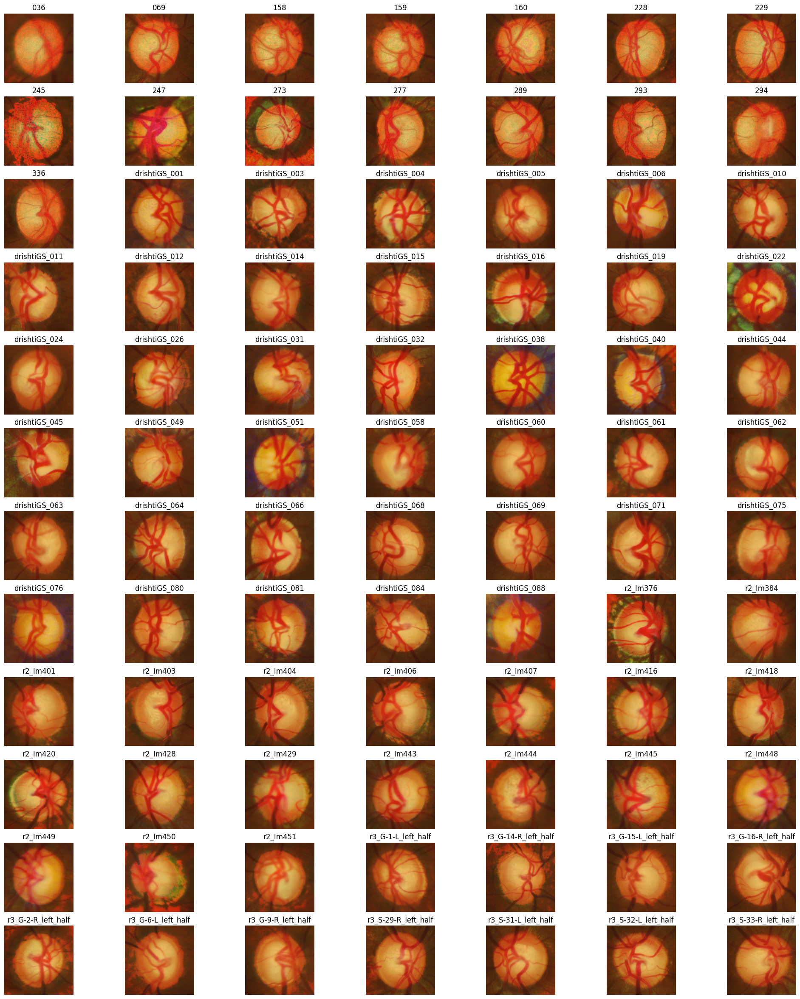

In [59]:
display_all(pos_matched, (12,7), (25,30))

## Optic Disc Segmentation

In [60]:
def get_which_ellipse(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    ellipse = cv2.fitEllipse(contours[cont_idx])
    return ellipse

def set_bleeds(img, trim_border=15):
    '''
    A bleed is a small area around the edge of 
    your artwork that extends beyond the “finished” 
    cut edge of your document.
    '''
    img[:, :trim_border] = 0
    img[:trim_border, :] = 0
    img[-trim_border:, :] = 0
    img[:, -trim_border:] = 0
    
    return img

def extract_od(matched):
    od_line = {}
    ods = {}
    
    okernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))
    ekernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,15))
    
    for img in matched:
        red = matched[img][:,:,0]
        gmc = adjust_gamma(red, 3)
        blurred = cv2.medianBlur(gmc, 25)
        opened = cv2.morphologyEx(blurred, cv2.MORPH_OPEN, okernel)
        eroded = cv2.morphologyEx(opened, cv2.MORPH_ERODE, ekernel)
        ret2, th2 = cv2.threshold(eroded,0,255,
                                  cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        binaries = set_bleeds(th2, 55)
        cont, hcy = cv2.findContours(binaries, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        ellipse = get_which_ellipse(cont)
        od = np.zeros_like(th2, dtype='uint8')
        od = cv2.ellipse(od, ellipse, (255, 255, 255), -1)
        ods[img] = od
        od_line[img] = ellipse
    
    print('done!')
    return od_line, ods

In [61]:
pm = deepcopy(pos_matched)
ps = deepcopy(pos)
od_lines, all_od = extract_od(pm)

done!


## Draw Function

In [62]:
def draw_od_line(imgs, roi_line, color):
    odlines = {}
    for img in imgs:
        odlines[img] = cv2.ellipse(imgs[img], 
                                   roi_line[img], 
                                   color, 
                                   3, 
                                   cv2.LINE_AA)
    return odlines

def draw_oc_line(imgs, roi_line, color):
    drawn_oc = {}
    
    for img in imgs:
        drawn_oc[img] = cv2.circle(imgs[img],roi_line[img][0],roi_line[img][1],color, 3)
    return drawn_oc

In [63]:
d_od = draw_od_line(ps, od_lines, (0, 255,0))

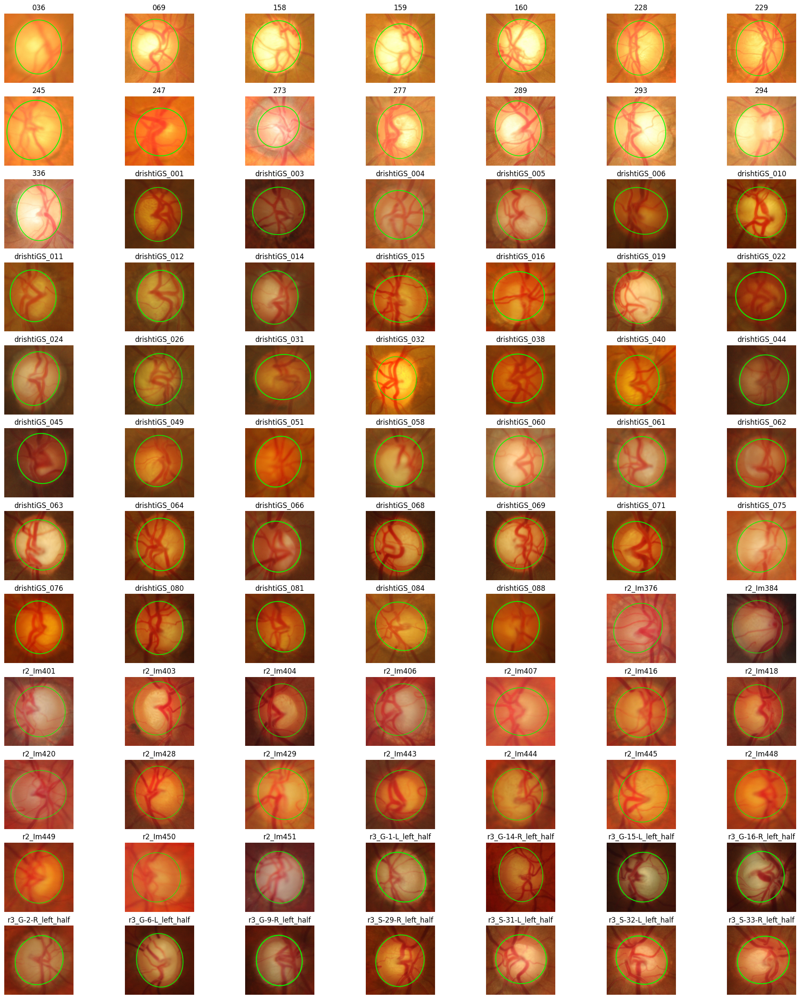

In [64]:
display_all(d_od, (12,7), (25,30))

## Optic Cup Segmentation

In [65]:
def get_circle(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    (x,y), radius = cv2.minEnclosingCircle(contours[cont_idx])
    return (x,y), radius

def select_boundaries(bnrs):
    cont, hcy = cv2.findContours(bnrs, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    (x,y),radius = get_circle(cont)
    center = (int(x),int(y))
    radius = int(radius)
    return (center, radius)

def extract_oc(imgs):
    p = {}
    oc_lines = {}
    ocs = {}
    close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (55,55))
    
    for img in imgs:
        green = imgs[img][:,:,1]
        gaussianblur = cv2.GaussianBlur(green, (15,15), 0)
        gmc = adjust_gamma(gaussianblur, 6)
        ret3, th3 = cv2.threshold(
            gmc,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        binaries = cv2.morphologyEx(th3, cv2.MORPH_CLOSE, close_kernel)
        eroded = cv2.erode(binaries, kernel=np.ones((15,15), np.uint8))
        center_rad = select_boundaries(eroded)
        oc_lines[img] = center_rad
        canvas = np.zeros_like(th3, dtype='uint8')
        ocs[img] = cv2.circle(canvas, center_rad[0], center_rad[1], (255, 255, 255), -1)
    print('success!')
    return oc_lines, ocs

In [66]:
oc_lines, all_oc = extract_oc(pos_matched)

success!


In [67]:
dod = deepcopy(d_od)

In [68]:
d_oc = draw_oc_line(dod, oc_lines, (0, 0, 255))

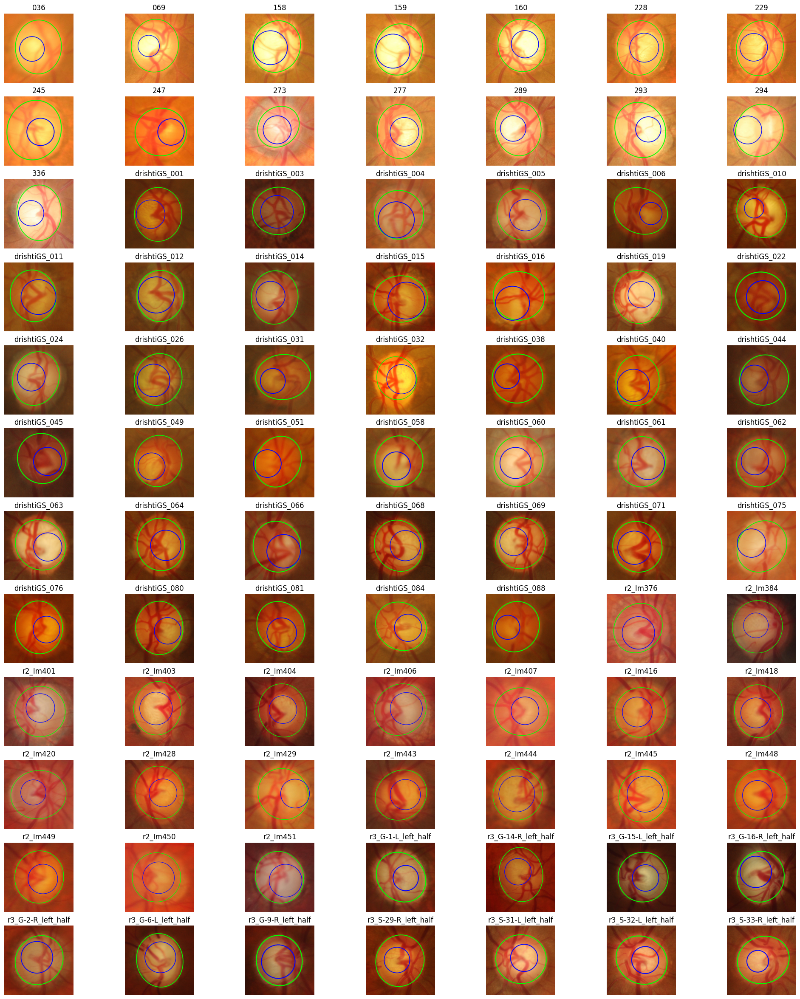

In [69]:
display_all(d_oc, (12,7), (25,30))

## Features Extraction

In [70]:
def get_cdr(optics):
    optic_width = [] # order: disc width, cup width
    optic_height = [] # order: disc height, cup height
    for optic in optics:
        cnt, _ = cv2.findContours(optic, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
        x,y,w,h = cv2.boundingRect(cnt[0])
        optic_width.append(w)
        optic_height.append(h)
    # print(f'width: {optic_width}\nheight: {optic_height}')
    return optic_width[1]/optic_width[0], optic_height[1]/optic_height[0]

def get_rdr(od, oc):
    rim = cv2.subtract(od,oc)
    RDR = 0
    conts, hierarchy = cv2.findContours(rim, cv2.RETR_TREE,
                                        cv2.CHAIN_APPROX_NONE)
    if len(conts) < 2:
        return 0
    else:
        od_ellipse = [cv2.approxPolyDP(conts[0], 0.01, True)]
        oc_ellipse = [cv2.approxPolyDP(conts[1], 0.01, True)]

        od_ellipse = np.vstack(od_ellipse).squeeze()
        oc_ellipse = np.vstack(oc_ellipse).squeeze()
        try:
            M = cv2.moments(od_ellipse)
            center_x = int(M['m10'] / M['m00'])
            center_y = int(M['m01'] / M['m00'])
        except:
            return 0
        else:
            rad_max = np.min([center_x, rim.shape[0] - center_x, center_y, rim.shape[1] - center_y])
            angles = np.arange(0, 360, 10)
            dists = np.zeros_like(angles)
            od_rad = np.zeros_like(dists)
            poly_outer = shapgeo.asLineString(od_ellipse)
            poly_inner = shapgeo.asLineString(oc_ellipse)

            for i, angle in enumerate(angles):
                angle = angle / 180 * np.pi
                x = np.cos(angle) * rad_max + center_x
                y = np.sin(angle) * rad_max + center_y
                points = [(center_x, center_y), (x, y)]
                poly_line = shapgeo.LineString(points)
                insec_outer = np.array(poly_outer.intersection(poly_line))
                insec_inner = np.array(poly_inner.intersection(poly_line))
                center_ = np.array([center_x, center_y])
                if len(insec_inner) != 0 and len(insec_outer) != 0:
                    dists[i] = np.linalg.norm(insec_outer - insec_inner)
                    od_rad[i] = (np.linalg.norm(insec_outer - center_)*2)
            dists = dists[dists > 0]
            od_rad = od_rad[od_rad > 0]
            min_dist = np.argmin(dists)
            RDR = dists[min_dist]/od_rad[min_dist]
            return RDR

def get_nrr_quadrant(nrr):
    nrr_quad = {}
    QUADRANTS = ['I', 'S', 'N', 'T']
    QUADRANTS_DEG = [0, 180, 90, 270]
    canvas = np.zeros_like(nrr, dtype='uint8')
    triangle_pts = np.array([
        [0, canvas.shape[1]],
        [canvas.shape[0]//2, canvas.shape[1]//2],
        [canvas.shape[0], canvas.shape[1]]
    ])
    main_mask = cv2.fillPoly(canvas, [triangle_pts], (255,255,255))
    for q, deg in zip(QUADRANTS, QUADRANTS_DEG):
        center_rot = (main_mask.shape[0]//2, main_mask.shape[1]//2)
        rot_mat = cv2.getRotationMatrix2D(center=center_rot, angle=deg, scale=1)
        nrr_quad[q] = cv2.warpAffine(main_mask,rot_mat,(main_mask.shape[0],main_mask.shape[1]))
    
    return nrr_quad

def calc_nrr(od, oc):
    neuroretinal = cv2.subtract(od, oc)
    rim_vals = []
    nqs = get_nrr_quadrant(neuroretinal)
    
    for nq in nqs:
        masked = cv2.bitwise_and(neuroretinal, neuroretinal, mask=nqs[nq])
        n_whitepx = cv2.countNonZero(masked)
        rim_vals.append(n_whitepx)
    return rim_vals[0], rim_vals[1], rim_vals[2], rim_vals[3]
    

def extract_features(ods, ocs):
    rims = {}
    feature_res = []
    print('extracting features...')
    # ========== Cup to Disc Ratio ==========
    for od, oc in zip(ods, ocs):
        cdr, vcdr = get_cdr((ods[od], ocs[oc]))
        # print(f'Name: {od}\t\tCDR: {cdr}\t\t\tVCDR: {vcdr}')
        rdr = get_rdr(ods[od], ocs[oc])
        I, S, N, T = calc_nrr(ods[od], ocs[oc])
        feature_res.append([od, cdr, vcdr, rdr, I, S, N, T, 1])
    return feature_res

In [71]:
feature_ex = extract_features(all_od, all_oc)

extracting features...


/tmp/ipykernel_135778/1538570051.py:95: ShapelyDeprecationWarning: The proxy geometries (through the 'asShape()', 'asLineString()' or 'LineStringAdapter()' constructors) are deprecated and will be removed in Shapely 2.0. Use the 'shape()' function or the standard 'LineString()' constructor instead.
  rdr = get_rdr(ods[od], ocs[oc])
/tmp/ipykernel_135778/1538570051.py:95: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  rdr = get_rdr(ods[od], ocs[oc])


## Dataframe

In [72]:
import pandas as pd

In [73]:
df_pos = pd.DataFrame(feature_ex, columns = ['Image', 'CDR', 'VCDR', 'RDR', 'I', 'S', 'N', 'T', 'Class'])

In [74]:
df_pos

,Image,CDR,VCDR,RDR,I,S,N,T,Class
0,036,0.538462,0.459854,0.088319,22491,28889,22943,11465,1
1,069,0.456522,0.408207,0.142512,31733,42565,23001,26136,1
2,158,0.707831,0.658263,0.015244,12911,18034,14420,4590,1
3,159,0.713433,0.665738,0.021084,13388,15952,15923,4592,1
4,160,0.573446,0.521851,0.141643,19417,22263,15337,19253,1
...,...,...,...,...,...,...,...,...,...
79,r3_G-9-R_left_half,0.731801,0.667832,0.103053,7718,9201,7311,6116,1
80,r3_S-29-R_left_half,0.528902,0.497283,0.167155,20736,18716,19445,14857,1
81,r3_S-31-L_left_half,0.539634,0.558360,0.158385,14366,13838,12357,17014,1
82,r3_S-32-L_left_half,0.532203,0.560714,0.149091,11109,11141,9543,13942,1
